# Amazing Graphs 

In [2]:
using Distributions, StatsPlots, Plots, StatsBase, LinearAlgebra
using SymPy
using LaTeXStrings
using SymPy
using VegaLite
using DataFrames
pyplot()

Plots.PyPlotBackend()

### Balanced Ternary
You write your number in base 3 and replace all the 2's to -1.

In [3]:
function Balanced_Ternary(n)
    if n==0
        return 0
    end
    if n%3 == 0
        return 3*Balanced_Ternary(n/3)
    elseif n%3 == 1
        return 3*Balanced_Ternary((n-1)/3)+1
    else
        return 3*Balanced_Ternary((n-2)/3) -1
    end
end
n = 300
bt = DataFrame(ID = collect(1:n),S = Balanced_Ternary.(collect(1:n)));

Play with different types of marks (e.g: area, line, circle), and see what changes.
Also, play with the colors.

WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window


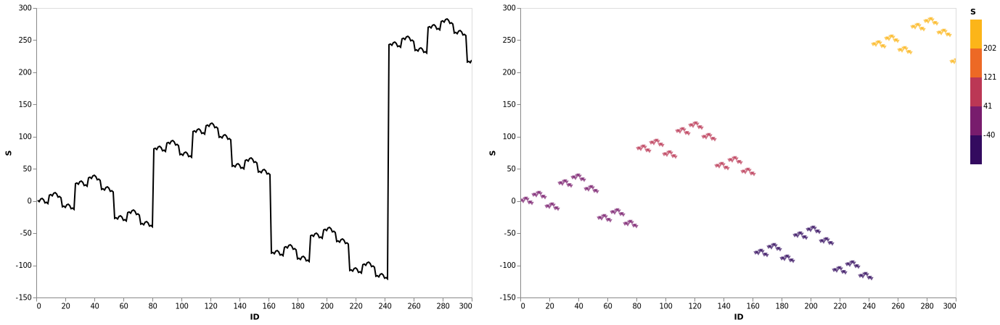

In [4]:
bt |> vl"""
{
"hconcat":[{

  "selection": {
    "grid": {
      "type": "interval", "bind": "scales"
    }},
  "mark": "line",
  "width": 600,
  "height": 400,
  "encoding": {
    "x": {"field": "ID", "type": "quantitative", "axis": {"grid":false}},
    "y": {"field": "S", "type": "quantitative", "axis":{"grid":false}},
    "color": {
      "value": "black"
    }
  }

},
{
  "selection": {
    "grid": {
      "type": "interval", "bind": "scales"
    }},
  "mark": {"type": "point", "shape":"triangle-down", "filled":true},
  "width": 600,
  "height": 400,
  "encoding": {
    "x": {"field": "ID", "type": "quantitative", "axis": {"grid":false}},
    "y": {"field": "S", "type": "quantitative", "axis":{"grid":false}},
    "color": {
      "field": "S", "type":"quantitative",
      "scale": {"type": "quantize","zero": true,"scheme": "inferno"}
    }
  }
}
]
}
"""

### Stern's diatomic series (or Stern-Brocot sequence):
a(0) = 0, a(1) = 1; for n > 0: a(2*n) = a(n), a(2*n+1) = a(n) + a(n+1). 

In [5]:
function Stern(n)
    if n < 2
        return n
    else
        if n%2 == 0
            Stern(n/2)
        else
            Stern((n-1)/2)+Stern((n+1)/2)
        end
    end
end

n = 1_000
stern = DataFrame(ID = collect(1:n),S = Stern.(collect(1:n)));

WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window


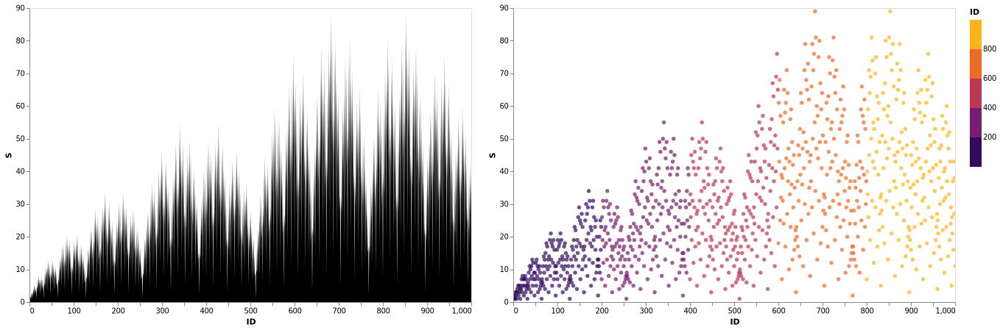

In [6]:
stern |> vl"""
{
"hconcat":[{

  "selection": {
    "grid": {
      "type": "interval", "bind": "scales"
    }},
  "mark": "area",
  "width": 600,
  "height": 400,
  "encoding": {
    "x": {"field": "ID", "type": "quantitative", "axis": {"grid":false}},
    "y": {"field": "S", "type": "quantitative", "axis":{"grid":false}},
    "color": {
      "value": "black"
    }
  }

},
{
  "selection": {
    "grid": {
      "type": "interval", "bind": "scales"
    }},
  "mark": {"type": "point", "filled":true},
  "width": 600,
  "height": 400,
  "encoding": {
    "x": {"field": "ID", "type": "quantitative", "axis": {"grid":false}},
    "y": {"field": "S", "type": "quantitative", "axis":{"grid":false}},
    "color": {
      "field": "ID", "type":"quantitative",
      "scale": {"type": "quantize","zero": true,"scheme": "inferno"}
    }
  }
}
]
}
"""

### Forest Fire
Sequence of positive integers where each is chosen to be as small
as possible subject to the condition that no three terms a(j), a(j+k),
a(j+2k) (for any j and k) form an arithmetic progression.

In [56]:
function Forest_Fire(N=100)
    a = [1,1]
    for n = 3:N
        i,j = 1,1
        b   = Set(Int[])
        while n-2*i >=1
            push!(b,2*a[n-i]-a[n-2*i])
            i+=1
            while j in b
                pop!(b,j)
                j+=1
            end
        end
        push!(a,j)
    end
    return a
end

N  = 30_000
ff = DataFrame(ID = collect(1:N),S = Forest_Fire(N));

WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window
WARN Can not resolve event source: window


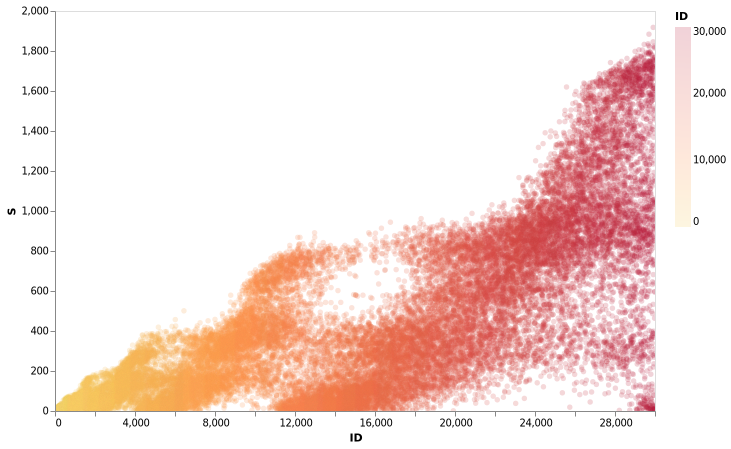

In [63]:
ff |> vl"""
{
"hconcat":[
{
  "selection": {
    "grid": {
      "type": "interval", "bind": "scales"
    }},
  "mark": {"type": "point", "filled":true,"opacity":0.2},
  "width": 600,
  "height": 400,
  "encoding": {
    "x": {"field": "ID", "type": "quantitative", "axis": {"grid":false}},
    "y": {"field": "S", "type": "quantitative", "axis":{"grid":false}},
    "color": {
      "field": "ID", "type":"quantitative",
      "scale": {"zero": true,"scheme": "goldred"}
    }
  }
}
]
}
"""